# Homework 9: Coding

**Due Tuesday December 6th, 11:59pm.**

**This is a group assignment.**

**Submit hw9.ipynb file to Gradescope (you may submit as many times as you'd like before the deadline). Note that there is no autograder.**

**Please use Google Colab to maintain consistency across the class.**

# Question 2: Q-Learning

In this question, we will implement Q-learning for a classic reinforcement learning problem, MountainCar-v0.
We will be using the OpenAI Gym as our environment -- **we strongly recommend looking over the ["Getting Started" documentation](https://gym.openai.com/docs/) .**

From the [official description](https://gym.openai.com/envs/MountainCar-v0/):

> A car is on a one-dimensional track, positioned between two "mountains". The goal is to drive up the mountain on the right; however, the car's engine is not strong enough to scale the mountain in a single pass. Therefore, the only way to succeed is to drive back and forth to build up momentum.


![](https://user-images.githubusercontent.com/8510097/31701297-3ebf291c-b384-11e7-8289-24f1d392fb48.PNG)


A formal description of the MountainCar task, with action and reward descriptions, can be found [here](https://github.com/openai/gym/wiki/MountainCar-v0):

>The observation space is two dimensional, `[position, velocity]` of type `Box(2)`:
- (horizontal) position: [-1.2, 0.6]
-  velocity: [-0.07, 0.07]

>The goal position is 0.5, the location of the flag on top of the hill.

>There are three possible actions of type `Discrete(3)`:
- 0: push left
- 1: no push
- 2: push right

>Reward: -1 for each time step, until the goal position of 0.5 is reached.

>Initialization: Random position from -0.6 to -0.4 with no velocity.

>Episode ends when you reach 0.5 position, or if 200 timesteps are reached. (So failure to reach the flag will result in a reward of -200).




## Dependencies and Imports

In [1]:
"""
installing dependencies
"""
!apt-get update # updated
!apt-get -qq -y install libnvtoolsext1 > /dev/null
!ln -snf /usr/lib/x86_64-linux-gnu/libnvrtc-builtins.so.8.0 /usr/lib/x86_64-linux-gnu/libnvrtc-builtins.so
!apt-get -qq -y install xvfb freeglut3-dev ffmpeg> /dev/null
!pip -q install gym
!pip -q install pyglet
!pip -q install pyopengl
!pip -q install pyvirtualdisplay
!pip -q install pygame

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Hit:2 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:3 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Ign:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Get:5 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease [1,581 B]
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:8 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Get:9 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [83.3 kB]
Hit:10 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:11 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:13 https://developer.downlo

In [2]:
"""
Imports
"""

import gym
import numpy as np
import math
import matplotlib.pyplot as plt
from collections import deque
import tensorflow as tf
from tensorflow import keras
import random
from gym import wrappers

from pyvirtualdisplay import Display
display = Display(visible=0, size=(1024, 768))
display.start()
import os
# os.environ["DISPLAY"] = ":" + str(display.display) + "." + str(display.screen)

import matplotlib.animation
import numpy as np
from IPython.display import HTML

# Note, you may get a few warnings regarding Tensorflow and xdpyinfo, these are to be expected

## 2.1 "Traditional" Q-Learning

Implement `choose_action`, `update_Q`, `update_epsilon`, and `Qlearning` below. Feel free to use any numpy utility functions you might need.

In [3]:
def discretize(state, discretization, env):
    """
    Helper function for discretizing states. This is required to map the continuous
    observation state space into discrete entries in the Q value matrix.
    
    Args:
        state (Box(2,)): the observation space state, here it is [position, velocity]
        discretization ((np.array): The discretization for each dimension of our observation space
        env: the RL environment 
        
    Returns:
        a discretized (int) version of the observation space state

    """

    env_low = env.observation_space.low
    disc1=(state - env_low)*discretization
    disc = np.round(disc1, 0).astype(int)
    return disc

def choose_action(epsilon, Q, state, env):
    """
    Choose an action according to an epsilon greedy strategy.
    
    Hint: np.argmax can be useful here.
    
    Args:
        epsilon (float): the probability of choosing a random action
        Q (np.array): The Q value matrix, here it is 3D for the two observation states and action states
        state (Box(2,)): the observation state, here it is [position, velocity]
        env: the RL environment 
        
    Returns:
        action (int): the chosen action
    """
    
    action = 0

    """TODO begin your code"""
    if( np.random.uniform(0, 2) < epsilon):
      action = random.randint(0,2)

    else:
      action = np.argmax(Q[state[0]][state[1]])
    """TODO end your code"""

    return action


def update_epsilon(epsilon, decay_rate):
    """
    Decay epsilon by the specified rate.
    
    Args:
        epsilon (float): the probability of choosing a random action
        decay_rate (float): the decay rate (between 0 and 1) to scale epsilon by
        
    Returns:
        updated epsilon
    """
    
    """TODO begin your code"""
    epsilon = decay_rate * epsilon
    """TODO end your code"""

    return epsilon


def update_Q(Q, state_disc, next_state_disc, action, discount, learning_rate, reward, terminal):
    """
    Update Q values following the Q-learning update rule. 
    
    Be sure to handle the terminal state case.
    See lecture https://www.seas.upenn.edu/~cis520/lectures/RL.pdf, slides 39-40.
    
    Args:
        Q (np.array): The Q value matrix, here it is 3D for the two observation states and action states
        state_disc (np.array): the discretized version of the current observation state [position, velocity]
        next_state_disc (np.array): the discretized version of the next observation state [position, velocity]
        action (int): the chosen action
        discount (float): the discount factor, may be referred to as gamma
        learning_rate (float): the learning rate, may be referred to as alpha
        reward (float): the current (immediate) reward
        terminal (bool): flag for whether the state is terminal
        
    Returns:
        Q, with the [state_disc[0], state_disc[1], action] entry updated.
    """

    """TODO begin your code"""
    if (terminal == True):
      Q[state_disc[0]][state_disc[1]][action] = reward

    action1 = np.max(Q[next_state_disc[0]][next_state_disc[1]])

    act2=(reward + discount*action1 - Q[state_disc[0]][state_disc[1]][action])

    Q[state_disc[0]][state_disc[1]][action] += learning_rate*act2
    """TODO end your code"""
    
    return Q

In [4]:
def Qlearning(Q, discretization, env, learning_rate, discount, epsilon, decay_rate, max_episodes):
    """
    The main Q-learning function, utilizing the functions implemented above.
    See lecture https://www.seas.upenn.edu/~cis520/lectures/RL.pdf, slide 40.

    Args:
        Q (np.array): The Q value matrix, here it is 3D for the two observation states and action states
        discretization (np.array): The number of discrete states to create for the two observation states 
        env: the RL environment
        learning_rate (float): the learning rate, may be referred to as alpha
        discount (float): the discount factor, may be referred to as gamma
        epsilon (float): the probability of choosing a random action
        decay_rate (float): the amount to decay epsilon
        max_episodes (int): the maximum number of episodes to run
        
    Returns:
        Q (np.array): the final Q value matrix
        ave_reward_list (list): a list of the average reward per 100 episodes
        position_list (list): a list of the final car position states reached over the episodes
        success_list (list): a list of the ratio of successes achieved over the episodes
        frames (list): a list of video frames to render
        
    """
    reward_list = []
    ave_reward_list = []
    position_list = []
    success_list = []
    frames = []
    success = 0 # count of number of successes reached 

    for i in range(max_episodes):
        # Initialize parameters
        done = False # indicates whether the episode is done
        terminal = False # indicates whether the episode is done AND the car has reached the flag (>=0.5 position)
        tot_reward = 0 # sum of total reward over a single
        state = env.reset() # initial environment state
        state_disc = discretize(state,discretization,env)
        
        while done != True:   
            # Render environment for first and last episode. You can change this to render different episodes
            if i == (max_episodes - 1) or i==1:
                frames.append(env.render(mode = 'rgb_array'))
                
            """TODO begin your code"""
            # Determine next action 
            act = choose_action(epsilon, Q, state_disc, env)

            # Get next_state, reward, and done using env.step(), see http://gym.openai.com/docs/#environments for reference
            next_state, reward, done, _ = env.step(act)

            # Discretize next state 
            next_state_disc = discretize(next_state, discretization, env)

            # Update terminal
            if(done == True and next_state[0]>=0.5):
              terminal = True
              success = success + 1

            # Update Q
            Q = update_Q(Q, state_disc, next_state_disc, act, discount, learning_rate, reward, terminal)
            
            # Update tot_reward, state_disc, and success (if applicable)
            tot_reward += reward
            state_disc = next_state_disc
            state = next_state
            """TODO end your code """
            
        # TODO Update level of epsilon using update_epsilon()
        epsilon = update_epsilon(epsilon, decay_rate)

        # Track rewards
        reward_list.append(tot_reward)
        position_list.append(next_state[0])
        success_list.append(success/(i+1))

        if (i+1) % 100 == 0:
            ave_reward_list.append(np.mean(reward_list))
            print('Episode: ', i+1, 'Average Reward over 100 Episodes: ',np.mean(reward_list))
            reward_list = []
                
    env.close()
    
    return Q, ave_reward_list, position_list, success_list, frames 


Run Q-learning, using your functions implemented above and the parameters given below.

In [5]:
# Initialize Mountain Car Environment
env = gym.make('MountainCar-v0')
env.seed(42)
np.random.seed(42)
env.reset()

# Parameters    
learning_rate = 0.2 
discount = 0.9
epsilon = 0.8 
decay_rate = 0.95
max_episodes = 5000
discretization = np.array([10,100]) 

#InitQ
num_states = (env.observation_space.high - env.observation_space.low)*discretization

#Size of discretized state space 
num_states = np.round(num_states, 0).astype(int) + 1
    
# Initialize Q table
Q = np.random.uniform(low = -1, 
                      high = 1, 
                      size = (num_states[0], num_states[1], env.action_space.n))

# Run Q Learning by calling your Qlearning() function
Q, rewards, position, successes, frames = Qlearning(Q, discretization, env, learning_rate, discount, epsilon, decay_rate, max_episodes)

/usr/local/lib/python3.8/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initializ

Episode:  100 Average Reward over 100 Episodes:  -200.0
Episode:  200 Average Reward over 100 Episodes:  -199.56
Episode:  300 Average Reward over 100 Episodes:  -199.54
Episode:  400 Average Reward over 100 Episodes:  -198.79
Episode:  500 Average Reward over 100 Episodes:  -189.95
Episode:  600 Average Reward over 100 Episodes:  -199.15
Episode:  700 Average Reward over 100 Episodes:  -180.42
Episode:  800 Average Reward over 100 Episodes:  -178.89
Episode:  900 Average Reward over 100 Episodes:  -166.89
Episode:  1000 Average Reward over 100 Episodes:  -182.85
Episode:  1100 Average Reward over 100 Episodes:  -159.93
Episode:  1200 Average Reward over 100 Episodes:  -168.44
Episode:  1300 Average Reward over 100 Episodes:  -162.07
Episode:  1400 Average Reward over 100 Episodes:  -168.6
Episode:  1500 Average Reward over 100 Episodes:  -179.14
Episode:  1600 Average Reward over 100 Episodes:  -174.89
Episode:  1700 Average Reward over 100 Episodes:  -184.31
Episode:  1800 Average Re

Plot the average reward, % successes, and car final position over the episodes using the code below and insert the figures into your Latex document:

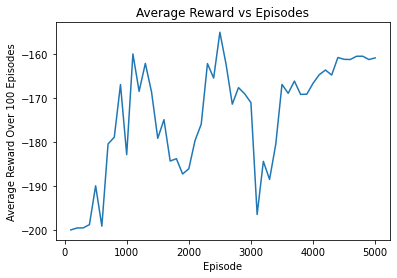

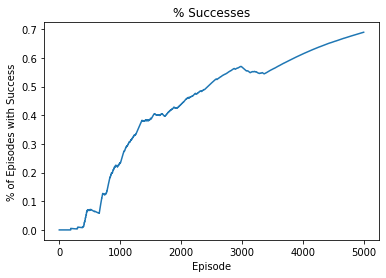

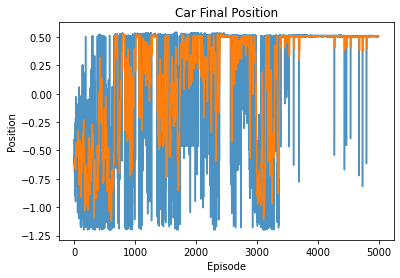

In [6]:
import pandas as pd 
#Note: plt.close() is useful to plot 3 seperate graphs

#TODO: Plot average reward over 100 episdes VS episode
plt.plot(100*(np.arange(len(rewards)) + 1), rewards)
plt.xlabel('Episode')
plt.ylabel('Average Reward Over 100 Episodes')
plt.title('Average Reward vs Episodes')
plt.show()   
plt.close() 

#TODO: Plot the % of episodes with success VS episode
plt.plot(successes)
plt.xlabel('Episode')
plt.ylabel('% of Episodes with Success')
plt.title('% Successes')
plt.show()
plt.close()

#TODO: Plot the final position of the car VS episode
p = pd.Series(position)
ma = p.rolling(10).mean()
plt.plot(p, alpha=0.8)
plt.plot(ma)
plt.xlabel('Episode')
plt.ylabel('Position')
plt.title('Car Final Position')
plt.show()

As a sanity check (and nice visualization), run the code below to play both the first and last episode of the learned policy consecutively. You should see a noticeable difference in the policies, with the last episode resulting in a success.

Insert an image of the car reaching the flag into your Latex document.



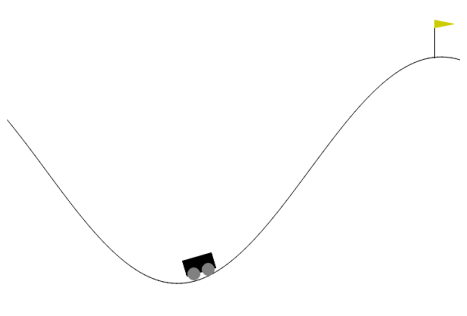

In [7]:
plt.figure(figsize=(frames[0].shape[1] / 72.0, frames[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(frames[0])
plt.axis('off')
animate = lambda i: patch.set_data(frames[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(frames), interval = 50)
HTML(ani.to_jshtml())

## 2.2 Deep Q-Learning

Now we will take a deep learning approach by using a neural network to represent the Q values. The network architecture is given in the PDF.

Note that we have given a `reward_shaping` function to aid with the training process.

Refer back to HW 4 or the [Pytorch tutorials](https://pytorch.org/tutorials/beginner/deep_learning_60min_blitz.html) if you need a refresher on PyTorch.

Implement `QNetwork`, `choose_action`, `reward_shaping`, and `DeepQLearning`. Feel free to use any Pytorch functions you might need.

In [8]:
"""
Imports you might need
"""
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.autograd import Variable
from datetime import datetime
import glob, os

In [9]:
class QNetwork(nn.Module):
    """
    Qnetwork approximates Q values. 
    
    The input is the state space, which for this problem is 2 values: [position, velocity]
    The output is the action space, which for this problem is: [left, no movt, right]
    """
    
    def __init__(self):
        super(QNetwork, self).__init__()
        self.state_space = 2 # TODO fill in
        self.action_space = 3 # TODO fill in
        self.hidden = 100 # TODO fill in
        self.l1 = nn.Linear(self.state_space, self.hidden, bias=False) # TODO fill in, don't use a bias term
        self.hid = nn.Linear(self.hidden, self.hidden, bias=False) # TODO fill in, don't use a bias term
        self.l2 = nn.Linear(self.hidden, self.action_space, bias=False) # TODO fill in, don't use a bias term
    
    def forward(self, x):    
        model = torch.nn.Sequential(
            # TODO fill in
            self.l1,
            torch.nn.Tanh(),
            self.hid,
            torch.nn.Tanh(),
            self.l2
        )

    
        return model(x)

In [10]:
def choose_action(Q, epsilon):
    """
    Choose an action according to an epsilon greedy strategy.
 
    Hint: torch.max can be useful to find the argmax: https://pytorch.org/docs/stable/torch.html#torch.max

    Args:
        Q (Tensor): Pytorch tensor representing Q values for the network
        epsilon (float): the probability of choosing a random action
  
    Returns:
        action (int): the chosen action
    """    
    action = 0
    """TODO start your code"""
    if (epsilon > np.random.uniform(0,2) ):
      action = random.randint(0,2)

    else:
      action = torch.argmax(Q).item()
    """TODO end your code"""
    
    return action 


def reward_shaping(next_state):
    """
    Alternative reward function based on next_state:
        - the reward is [position] + 0.5
        - if the car has succeeded in reaching the flag (i.e. position >=0.5), add +1 on top of the reward just computed.
    
    Also described in the PDF.
    
    Returns:
        reward (float)
    """
    reward = next_state[0] + 0.5

    if (next_state[0] >= 0.5):
      reward = reward + 1
    """TODO end your code """
    
    return reward

In [11]:
def DeepQlearning(env, qnetwork, objective, optimizer, scheduler, epsilon, discount, decay_rate, max_episodes):
    """
    The main Q-learning function, utilizing the functions and QNetwork implemented above.

    Args:
        env: the RL environment
        qnetwork (QNetwork): an instance of the QNetwork class defined above 
        objective (torch.nn.modules.loss): the objective (loss) function
        optimizer (torch.optim.sgd): the optimization method
        scheduler (torch.optim.lr_scheduler): adaptive learning rate method
        epsilon (float): the probability of choosing a random action
        discount (float): the discount factor, may be referred to as gamma
        decay_rate (float): the amount to decay epsilon
        max_episodes (int): the maximum number of episodes to run
        
    Returns:
        position (list): a list of the final car position states reached over the episodes
        success_history (list): a list of the ratio of successes achieved over the episodes
        frames (list): a list of video frames to render
    """
    successes = 0
    position = []
    success_history = []
    frames = []
    steps = 200
    for episode in range(max_episodes):
        episode_loss = 0
        episode_reward = 0
        state = env.reset()

        for s in range(steps):

            if episode == (max_episodes - 1) or episode==1:
                frames.append(env.render(mode = 'rgb_array'))
            
            state_tensor = torch.tensor(state, requires_grad = True).float()
            """TODO begin your code"""
            # TODO get Q by making the forward pass using state
            Q = qnetwork.forward(torch.from_numpy(state).float())
            # Determine next action
            # TODO fill in
            action = choose_action(Q, epsilon)
            # Get next_state and done using env.step(), see http://gym.openai.com/docs/#environments for reference
            # TODO fill in
            next_state, _, done,_ = env.step(action)
            # Use reward_shaping() to get the reward
            # TODO fill in
            reward = reward_shaping(next_state)
            # Find max Q for t+1 state using the Q1 qnetwork
            #Q1 = qnetwork(Variable(torch.from_numpy(next_state).float()))
            # TODO make the forward pass using next_state 
            Q1 = qnetwork.forward(torch.from_numpy(next_state).float())

            # Create Q_target value for training the policy, see slide 12 of https://www.seas.upenn.edu/~cis520/lectures/RL_recitation.pdf
            # TODO fill in
            maxQ1 = torch.max(Q1).item()
            Q_target = Q.clone()
            Q_target = Variable(Q_target)
            Q_target[action] = reward + discount*maxQ1

            # Calculate loss between Q and Q_target value using objective param
            # TODO fill in 
            loss = objective(Q, Q_target)
            
            # Update qnetwork policy (backwards pass) using optimizer param
            # TODO fill in
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            episode_loss += loss.item()
            episode_reward += reward
            
            
            if done:
              #TODO Print the episode count and reward at every 100 episodes
                if next_state[0] >= 0.5:
                    #TODO update epsilon, scheduler, and successes using decay_rate
                    epsilon = epsilon*decay_rate
                    scheduler.step()
                    successes += 1

                    if (episode+1)%100==0:
                      print('Episode: ', episode+1, 'Reward per Episode: ',episode_reward)

                success_history.append(successes/(episode+1))
                position.append(next_state[0])

                break
            else:
                state = next_state
          
    return position, success_history, frames



Run Deep Q Learning, using your functions implemented above and the parameters given below. Use `nn.MSELoss()` as the objective, `optim.SGD()` with the given `learning_rate` as the optimizer, and `optim.lr_scheduler.StepLR()` with the given `step_size` and `gamma` as the learning rate scheduler. 

In [12]:
env = gym.make('MountainCar-v0')
env.seed(1); torch.manual_seed(1); np.random.seed(1)
state = env.reset()
# Parameters
epsilon = 0.3
discount = 0.99
max_episodes = 1000
learning_rate = 0.001 # the learning rate for optimizer
step_size = 1 # the step size for scheduler
gamma = 0.9 # the gamma for scheduler, be sure not to mix this up with discount
decay_rate = 0.95 # decay rate for epsilon

# Initialize Policy
qnetwork = QNetwork() # TODO fill in
objective = torch.nn.MSELoss() # TODO fill in 
optimizer = torch.optim.SGD(qnetwork.parameters(),lr = learning_rate) # TODO fill in 
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size, gamma) # TODO fill in

# Run Deep Q Learning and save deep_position, deep_successes, deep_frames
deep_p, deep_s, deep_f = DeepQlearning(env, qnetwork, objective, optimizer, scheduler, epsilon, discount, decay_rate, max_episodes)

/usr/local/lib/python3.8/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/core.py:256: DeprecationWarning: WARN: Function `env.seed(seed)` is marked as deprecated and will be removed in the future. Please use `env.reset(seed=seed)` instead.
  deprecation(
/usr/local/lib/python3.8/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initializ

Episode:  100 Reward per Episode:  32.13908968586475
Episode:  200 Reward per Episode:  18.912279397714883
Episode:  300 Reward per Episode:  6.023354181786999
Episode:  400 Reward per Episode:  10.123485967516899
Episode:  500 Reward per Episode:  11.530433492735028
Episode:  600 Reward per Episode:  4.4178027886664495
Episode:  700 Reward per Episode:  10.96022220980376
Episode:  1000 Reward per Episode:  17.100584869273007


Plot the % successes and car final position over the episodes using the code below and insert the figures into your Latex document:

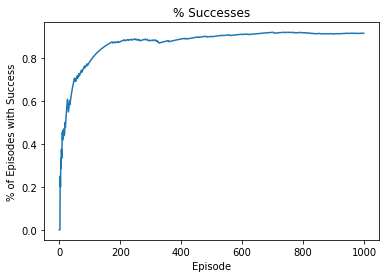

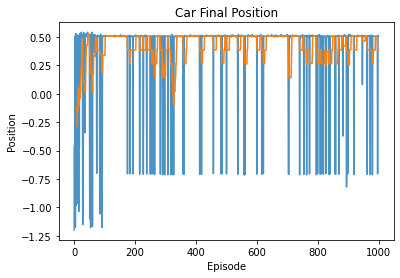

In [13]:
import pandas as pd 

#TODO: Plot the % of episodes with success VS episode
plt.plot(deep_s)
plt.xlabel('Episode')
plt.ylabel('% of Episodes with Success')
plt.title('% Successes')
plt.show()
plt.close()

#TODO: Plot the final position of the car VS episode
p = pd.Series(deep_p)
ma = p.rolling(10).mean()
plt.plot(p, alpha=0.8)
plt.plot(ma)
plt.xlabel('Episode')
plt.ylabel('Position')
plt.title('Car Final Position')
plt.show()


Again as a sanity check, run the code below to play both the first and last episode of the learned policy consecutively. You should see a noticeable difference in the policies, with the last episode resulting in a success.

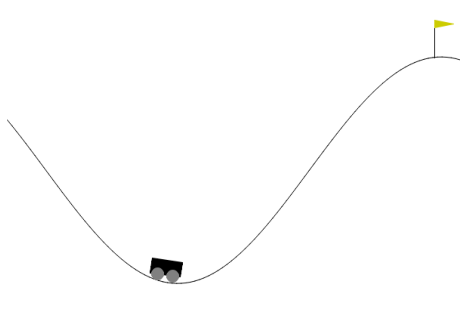

In [14]:
plt.figure(figsize=(deep_f[0].shape[1] / 72.0, deep_f[0].shape[0] / 72.0), dpi = 72)
patch = plt.imshow(deep_f[0])
plt.axis('off')
animate = lambda i: patch.set_data(deep_f[i])
ani = matplotlib.animation.FuncAnimation(plt.gcf(), animate, frames=len(deep_f), interval = 50)
HTML(ani.to_jshtml())

## 2.3 Questions


1.  As part of the Deep QLearning implementation, we have provided a $\mathsf{reward\_shaping}$ function to aid in the learning process. Briefly describe what it is doing. Compare this to the original reward structure in part 2.1 -- why do you think this modification of the reward is helpful?

2. Compare the **Success Rate** and **Car Final Position** plots between your two implementations. Which algorithm is learning a successful policy more quickly? Briefly comment on potential reasons for any differences in performance.

Insert your responses in your Latex document.
